Tasks:

- retrieve ATL03 data for TOC height 2020, 2021 and 2022
- convert it from df > gdf
- clip it to each area defined on QGIS
    - assign projection 32733 to raster
    - batch clip raster with area123 clip layers
    - batch polygonize clipped rasters and save as shapefiles
    - remove nodata [0] values.
- create 10m voxels of the ATL03 poitcloud > downsample to 10m (we lose the columns from point cloud)
- do spatial join to retrieve back information from pointcloud data
- kdtree analysis with Biomass, GCH data for 2020/2021/2022
- export final gdf as csv file with coordinates (XYZ)
- manually filter one track using QGIS.
- plot results

In [1]:
from geopandas.tools import sjoin_nearest
from scipy.spatial import cKDTree
from IPython.display import Image
import geopandas as gpd
from pyproj import CRS
import pandas as pd

import warnings
warnings.filterwarnings("ignore")


from raster_functions import *
EPSG_Namibia_Code = 32733

/tmp/ipykernel_189114/1060763125.py:1: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  from geopandas.tools import sjoin_nearest


- retrieve ATL03 data for TOC height 2020 and 2021

In [2]:
%%time

directory = '/DATA/magalhaes/icesat2_atl03/atl03_hdf_window/'

file_pattern = ['ATL03_TOC', 'ATL03_Grass']
start_date = '2020-01-01'
nmonths = 27 # select 2 years: 2020, 2021, 2022

dfs_list = merge_df_nmonths(directory, start_date, nmonths, file_pattern)

CPU times: user 19.8 s, sys: 2.86 s, total: 22.7 s
Wall time: 29.4 s


- convert it from df > gdf

In [3]:
gdf_TOC, gdf_Grass = convert_to_geodataframe(dfs_list)

In [4]:
gdf_TOC.head()

,Latitude,Longitude,Along-track_Distance,Land,Easting,Northing,crosstrack,alongtrack,Ground_interp_Height,TOC_Height,z,x,NN,Photons_Numb,Date,easting_sq,northing_sq,geometry
4581421,-19.741916,16.999477,5.524872,2.0,709527.506436,7.815843e+06,-932.457289,2.198003e+06,1433.179283,3.250160,0.005333,0.015354,6.0,3.0,2020-01-03,709,7815,POINT (709527.506 7815842.573)
4581878,-19.743571,16.999300,9.481005,2.0,709506.815201,7.815660e+06,-931.672907,2.198187e+06,1433.026099,3.411156,0.008786,0.021671,7.0,1.0,2020-01-03,709,7815,POINT (709506.815 7815659.571)
4582023,-19.744135,16.999241,12.185640,2.0,709499.917669,7.815597e+06,-931.561748,2.198250e+06,1432.992564,3.390370,0.008340,0.023824,8.0,1.0,2020-01-03,709,7815,POINT (709499.918 7815597.176)
4584913,-19.754959,16.998110,14.957241,2.0,709367.231227,7.814400e+06,-929.052147,2.199454e+06,1434.291224,4.056677,0.022630,0.065125,6.0,1.0,2020-01-03,709,7814,POINT (709367.231 7814400.327)
4585013,-19.755259,16.998079,8.344965,2.0,709363.562365,7.814367e+06,-928.997712,2.199488e+06,1434.089802,4.454510,0.031162,0.066271,6.0,1.0,2020-01-03,709,7814,POINT (709363.562 7814367.095)


In [5]:
gdf_Grass.head()

,Latitude,Longitude,Along-track_Distance,Land,Easting,Northing,crosstrack,alongtrack,Ground_interp_Height,Grass_Height,z,x,NN,Date,easting_sq,northing_sq,geometry
4589039,-19.769962,16.996531,2.317667,2.0,709182.127295,7.812741e+06,-924.402155,2.201123e+06,1435.882622,1.390083,0.355958,0.124581,6.0,2020-01-03,709,7812,POINT (709182.127 7812741.294)
4589386,-19.771172,16.996406,16.800041,2.0,709167.445326,7.812607e+06,-924.274533,2.201258e+06,1436.086324,1.382426,0.352889,0.129189,6.0,2020-01-03,709,7812,POINT (709167.445 7812607.473)
4589468,-19.771438,16.996379,6.399834,2.0,709164.276040,7.812578e+06,-924.310668,2.201288e+06,1436.120879,1.384492,0.353717,0.130203,6.0,2020-01-03,709,7812,POINT (709164.276 7812577.997)
4589546,-19.771731,16.996349,18.915548,2.0,709160.762893,7.812546e+06,-924.315818,2.201320e+06,1436.080995,1.391173,0.356395,0.131317,7.0,2020-01-03,709,7812,POINT (709160.763 7812545.646)
4594241,-19.789237,16.994510,4.405728,2.0,708945.181145,7.810610e+06,-919.290971,2.203268e+06,1436.551500,0.959364,0.183333,0.197976,6.0,2020-01-03,708,7810,POINT (708945.181 7810609.834)


In [6]:
gdf_TOC.shape

(11888223, 18)

- clip it to each area defined on QGIS

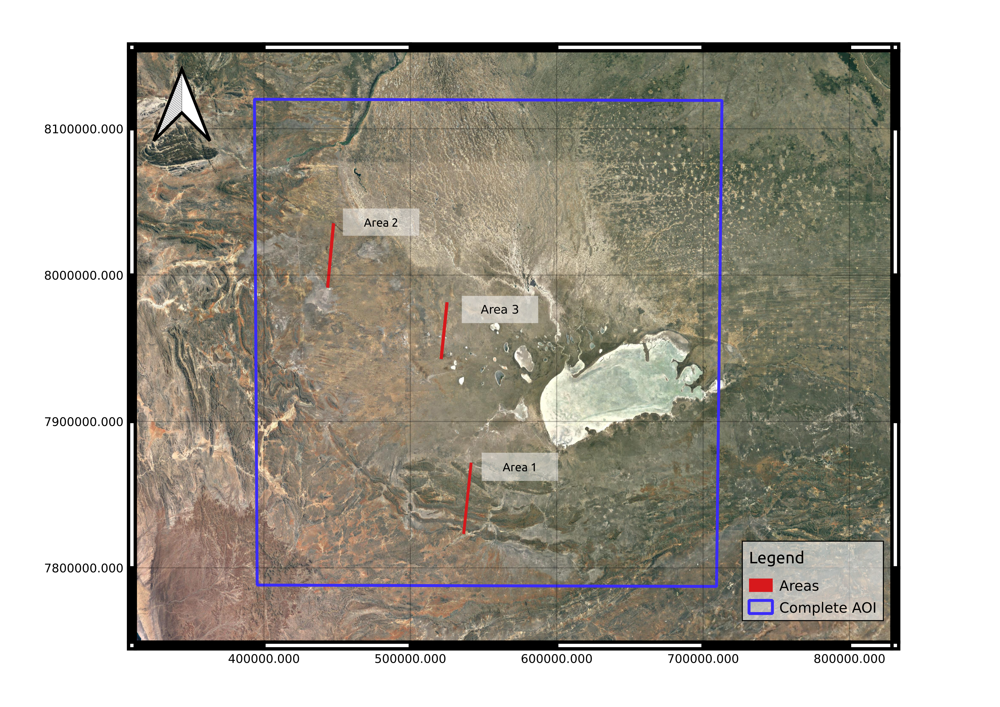

In [7]:
Image(filename='../raster_analysis/kdtree_areas/areas.png')

In [8]:
area_paths = ['../raster_analysis/kdtree_areas/area1.geojson',
              '../raster_analysis/kdtree_areas/area2.geojson',
              '../raster_analysis/kdtree_areas/area3.geojson']

clipped_gdfs = []
for path in area_paths:
    with open(path) as f:
        clip_gdf = gpd.read_file(f)
    gdf_TOC.loc[gdf_TOC.intersects(clip_gdf.unary_union), 'clipped'] = True
    clipped_gdf = gdf_TOC[gdf_TOC['clipped'] == True].copy()
    clipped_gdfs.append(clipped_gdf)
    gdf_TOC.drop('clipped', axis=1, inplace=True)

# Access the clipped GeoDataFrames as clipped_gdfs[0], clipped_gdfs[1], etc.
area1_TOC = clipped_gdfs[0]
area2_TOC = clipped_gdfs[1]
area3_TOC = clipped_gdfs[2]

In [9]:
area_paths = ['../raster_analysis/kdtree_areas/area1.geojson',
              '../raster_analysis/kdtree_areas/area2.geojson',
              '../raster_analysis/kdtree_areas/area3.geojson']

clipped_gdfs = []
for path in area_paths:
    with open(path) as f:
        clip_gdf = gpd.read_file(f)
    gdf_Grass.loc[gdf_Grass.intersects(clip_gdf.unary_union), 'clipped'] = True
    clipped_gdf = gdf_Grass[gdf_Grass['clipped'] == True].copy()
    clipped_gdfs.append(clipped_gdf)
    gdf_Grass.drop('clipped', axis=1, inplace=True)

# Access the clipped GeoDataFrames as clipped_gdfs[0], clipped_gdfs[1], etc.
area1_Grass = clipped_gdfs[0]
area2_Grass = clipped_gdfs[1]
area3_Grass = clipped_gdfs[2]

In [10]:
area1_TOC.shape, area2_TOC.shape, area3_TOC.shape

((16002, 19), (21549, 19), (14657, 19))

In [11]:
area1_Grass.shape, area2_Grass.shape, area3_Grass.shape

((15882, 18), (19904, 18), (19417, 18))

In [12]:
del dfs_list, gdf_Grass, gdf_TOC

- create 10m voxels of the ATL03 poitcloud > downsample to 10m

In [13]:
def voxelize_gdf(gdf, voxel_size):
    """
    Function that takes a point clound gdf with geometry xyz and creates voxels of defined size.
    
    """
    # Define TOC_Height as z in the geometry column xy 
    gdf['geometry'] = gdf.apply(lambda row: Point(row.geometry.x, row.geometry.y, row.TOC_Height), axis=1)
    
    # Determine the bounds of the point cloud data in X, Y, and Z dimensions
    xmin, ymin = gdf.total_bounds[:2]
    xmax, ymax = gdf.total_bounds[2:]
    zmin = np.amin(gdf.geometry.apply(lambda p: p.z))
    zmax = np.amax(gdf.geometry.apply(lambda p: p.z))

    # Calculate the number of voxels needed in each dimension
    xdim = int(np.ceil((xmax - xmin) / 10))
    ydim = int(np.ceil((ymax - ymin) / 10))
    zdim = int(np.ceil((zmax - zmin) / 10))

    # Create an empty voxel grid with dimensions equal to the number of voxels needed in each dimension
    voxels = np.zeros((xdim, ydim, zdim))
    zvalues = []

    # Iterate through each point in the point cloud data, and assign it to the appropriate voxel in the grid
    for i, row in gdf.iterrows():
        x, y, z = row['geometry'].x, row['geometry'].y, row['geometry'].z
        xidx = int((x - xmin) // 10)
        yidx = int((y - ymin) // 10)
        zidx = int((z - zmin) // 10)
        voxels[xidx, yidx, zidx] += 1
        zvalues.append(z)

    # Calculate the median Z value for each voxel
    zmedian = np.zeros((xdim, ydim, zdim))
    for xidx in range(xdim):
        for yidx in range(ydim):
            for zidx in range(zdim):
                if voxels[xidx, yidx, zidx] > 0:
                    zvals = []
                    for i in range(int(voxels[xidx, yidx, zidx])):
                        zvals.append(zvalues.pop(0))
                    zmedian[xidx, yidx, zidx] = np.median(zvals)

    # Convert the voxel grid to a GeoDataFrame
    points = []
    for xidx in range(xdim):
        for yidx in range(ydim):
            for zidx in range(zdim):
                if voxels[xidx, yidx, zidx] > 0:
                    x = xmin + (xidx + 0.5) * 10
                    y = ymin + (yidx + 0.5) * 10
                    z = zmin + (zidx + 0.5) * 10
                    zmed = zmedian[xidx, yidx, zidx]
                    point = Point(x, y, zmed)
                    points.append(point)
    gdf_voxels = gpd.GeoDataFrame(geometry=points)

    return gdf_voxels

In [14]:
area1_TOC_voxels = voxelize_gdf(gdf=area1_TOC, voxel_size=10)
area2_TOC_voxels = voxelize_gdf(gdf=area2_TOC, voxel_size=10)
area3_TOC_voxels = voxelize_gdf(gdf=area3_TOC, voxel_size=10)

crs = CRS.from_epsg(EPSG_Namibia_Code)
area1_TOC_voxels.crs = crs
area2_TOC_voxels.crs = crs
area3_TOC_voxels.crs = crs

In [15]:
area1_TOC = sjoin_nearest(area1_TOC_voxels, area1_TOC, distance_col='distance')
area2_TOC = sjoin_nearest(area2_TOC_voxels, area2_TOC, distance_col='distance')
area3_TOC = sjoin_nearest(area3_TOC_voxels, area3_TOC, distance_col='distance')

In [16]:
# check maximum distance of spatial join nearest neighbour
area1_TOC['distance'].max(), area2_TOC['distance'].max(), area3_TOC['distance'].max()

(7.047764915861145, 7.01739148123381, 7.0710678118654755)

- kdtree analysis with Biomass, GCH data for 2020/2021

In [17]:
def kdtree_comparison(point_gdf, polygon_gdf, polygon_column_name, new_column_name):
    # Create a k-d tree from the polygons in the polygon GeoDataFrame
    polygon_tree = cKDTree(np.array([np.array(x.centroid.coords)[0] for x in polygon_gdf.geometry]))

    # Find the nearest polygon to each point in the point GeoDataFrame
    distances, indices = polygon_tree.query(np.array([np.array(x.coords)[0] for x in point_gdf.geometry]), k=1)

    # Add a new column to the point GeoDataFrame with the value from the nearest polygon
    point_gdf[new_column_name] = polygon_gdf.iloc[indices][polygon_column_name].values

    # Return the updated point GeoDataFrame
    return point_gdf

In [18]:
# Remove z from geometry xyz for KDTree analysis
area1_TOC['geometry'] = area1_TOC.apply(lambda row: Point(row.geometry.x, row.geometry.y), axis=1)
area2_TOC['geometry'] = area2_TOC.apply(lambda row: Point(row.geometry.x, row.geometry.y), axis=1)
area3_TOC['geometry'] = area3_TOC.apply(lambda row: Point(row.geometry.x, row.geometry.y), axis=1)

In [19]:
# Read files as geodataframe
biomass_area1 = gpd.read_file('../raster_analysis/kdtree_areas/biomass_2018_area1.shp')
gch_area1 = gpd.read_file('../raster_analysis/kdtree_areas/gch_area1.shp')

# Run KDTree analysis for each dataset
area1_TOC_biomass = kdtree_comparison(area1_TOC, biomass_area1, 'biomass', 'biomass')
area1_TOC_biomass_gch = kdtree_comparison(area1_TOC_biomass, gch_area1, 'gch_m', 'gch_m')


In [20]:
# Read files as geodataframe
biomass_area2 = gpd.read_file('../raster_analysis/kdtree_areas/biomass_2018_area2.shp')
gch_area2 = gpd.read_file('../raster_analysis/kdtree_areas/gch_area2.shp')

# Run KDTree analysis for each dataset
area2_TOC_biomass = kdtree_comparison(area2_TOC, biomass_area2, 'biomass', 'biomass')
area2_TOC_biomass_gch = kdtree_comparison(area2_TOC_biomass, gch_area2, 'gch_m', 'gch_m')


In [21]:
# Read files as geodataframe
biomass_area3 = gpd.read_file('../raster_analysis/kdtree_areas/biomass_2018_area3.shp')
gch_area3 = gpd.read_file('../raster_analysis/kdtree_areas/gch_area3.shp')

# Run KDTree analysis for each dataset
area3_TOC_biomass = kdtree_comparison(area3_TOC, biomass_area3, 'biomass', 'biomass')
area3_TOC_biomass_gch = kdtree_comparison(area3_TOC_biomass, gch_area3, 'gch_m', 'gch_m')


In [22]:
area3_TOC_biomass_gch.head()

,geometry,index_right,Latitude,Longitude,Along-track_Distance,Land,Easting,Northing,crosstrack,alongtrack,...,x,NN,Photons_Numb,Date,easting_sq,northing_sq,clipped,distance,biomass,gch_m
0,POINT (521160.097 7942710.342),4981289,-18.606449,15.200532,17.436821,0.0,521155.097222,7.942705e+06,2650.297842,2.067402e+06,...,0.535435,38.0,4.0,2020-11-11,521,7942,True,7.071068,5,1
1,POINT (521160.097 7942720.342),4981264,-18.606340,15.200544,5.302335,0.0,521156.374946,7.942717e+06,2650.240977,2.067390e+06,...,0.535398,54.0,1.0,2020-11-11,521,7942,True,4.741890,5,1
2,POINT (521160.097 7942730.342),4981227,-18.606206,15.200557,10.377905,0.0,521157.759542,7.942732e+06,2650.361014,2.067375e+06,...,0.535354,30.0,2.0,2020-11-11,521,7942,True,3.036485,5,1
3,POINT (521160.097 7942800.342),4981067,-18.605630,15.200617,6.425024,0.0,521164.214920,7.942796e+06,2650.347727,2.067311e+06,...,0.535162,45.0,2.0,2020-11-11,521,7942,True,6.025255,5,1
4,POINT (521170.097 7942810.342),4981024,-18.605478,15.200633,9.463347,0.0,521165.875939,7.942813e+06,2650.395910,2.067294e+06,...,0.535111,36.0,3.0,2020-11-11,521,7942,True,4.903485,5,1


- export final gdf for QGIS filtering


In [22]:
area1_TOC_biomass_gch.to_file('../raster_analysis/kdtree_areas/output/raw/area1_TOC_biomass_gch.geojson', driver='GeoJSON')
area2_TOC_biomass_gch.to_file('../raster_analysis/kdtree_areas/output/raw/area2_TOC_biomass_gch.geojson', driver='GeoJSON')
area3_TOC_biomass_gch.to_file('../raster_analysis/kdtree_areas/output/raw/area3_TOC_biomass_gch.geojson', driver='GeoJSON')

In [ ]:
del area1_TOC_biomass_gch, area2_TOC_biomass_gch, area3_TOC_biomass_gch, area1_TOC_biomass, area2_TOC_biomass, area3_TOC_biomass, area1_TOC_voxels, area2_TOC_voxels, area3_TOC_voxels, area1_TOC, area2_TOC, area3_TOC

- plot results

#### After Filtering on QGIS

#### Area1

In [24]:
# Load the GeoJSON file as a GeoDataFrame
area1 = gpd.read_file('../raster_analysis/kdtree_areas/output/kdtree_output_filtered/area1_TOC_biomass_gch.geojson')
area2 = gpd.read_file('../raster_analysis/kdtree_areas/output/kdtree_output_filtered/area2_TOC_biomass_gch.geojson')
area3 = gpd.read_file('../raster_analysis/kdtree_areas/output/kdtree_output_filtered/area3_TOC_biomass_gch.geojson')

In [ ]:
area1.shape, area2.shape, area3.shape

- Adding Grass Height to gdf of each area

In [25]:
# Use KDTree to retrieve closest grass height values
area1 = kdtree_comparison(area1, area1_Grass, 'Grass_Height', 'Grass_Height')
area2 = kdtree_comparison(area2, area2_Grass, 'Grass_Height', 'Grass_Height')
area3 = kdtree_comparison(area3, area3_Grass, 'Grass_Height', 'Grass_Height')

In [26]:
area1.columns

Index(['geometry', 'index_right', 'Latitude', 'Longitude',
       'Along-track_Distance', 'Land', 'Easting', 'Northing', 'crosstrack',
       'alongtrack', 'Ground_interp_Height', 'TOC_Height', 'z', 'x', 'NN',
       'Photons_Numb', 'Date', 'easting_sq', 'northing_sq', 'clipped',
       'distance', 'biomass', 'gch_m', 'Grass_Height'],
      dtype='object')

In [27]:
del area1_Grass, area2_Grass, area3_Grass

In [ ]:
import matplotlib.cm as cm

# Create a 3D figure and axis
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Extract the X, Y, and Z coordinates from the geometry column
x = area1.geometry.x
y = area1.geometry.y
z = (area1.TOC_Height + area1.Ground_interp_Height)
v = (area1.biomass + area1.Ground_interp_Height)

# Set the marker size based on a column of the GeoDataFrame
size_column = 'TOC_Height'
size = area1[size_column] 
scaled_size = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Greens, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar2 = plt.colorbar(sm)
cbar2.set_label('TOC [m]')

# Set the marker size based on a column of the GeoDataFrame
size_column = 'biomass'
size = area1[size_column] 
scaled_size3 = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Oranges, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar = plt.colorbar(sm)
cbar.set_label('Biomass [Mg ha-1]')


# Plot the points in 3D with marker size based on the specified column
ax.scatter(x, y, z, c=area1['TOC_Height'], alpha=0.5, label='ATL03 TOC', cmap='Greens')#, s=scaled_size)
ax.scatter(x, y, v, c=area1['biomass'], alpha=0.5, label='Above-Ground Biomass', cmap='Oranges')#, s=scaled_size3)

# Set axis labels
ax.set_xlabel('Easting')
ax.set_ylabel('Northing')
ax.set_zlabel('Height [m]')
ax.legend()

# Show the plot
plt.show()

- create zoomed plot

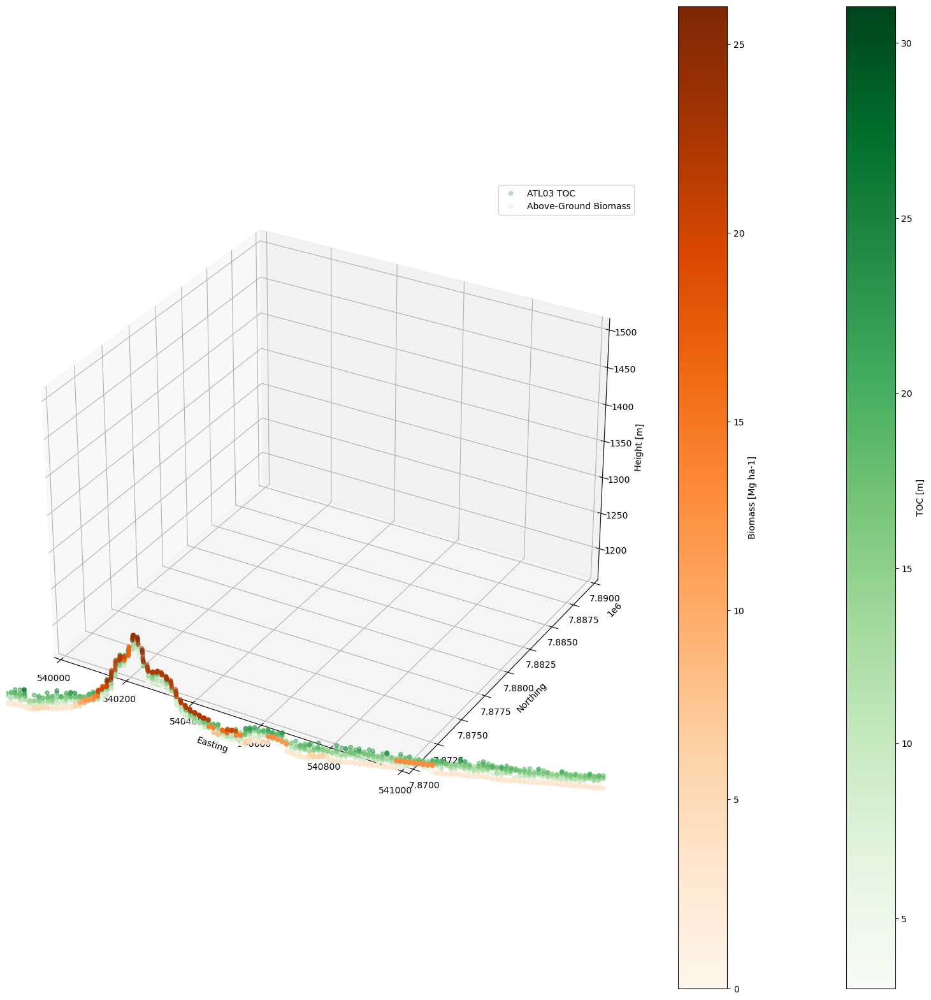

In [32]:
# Create a 3D figure and axis
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Extract the X, Y, and Z coordinates from the geometry column
x = area1.geometry.x
y = area1.geometry.y
z = (area1.TOC_Height + area1.Ground_interp_Height)
v = (area1.biomass + area1.Ground_interp_Height)

# Set the marker size based on a column of the GeoDataFrame
size_column = 'TOC_Height'
size = area1[size_column] 
scaled_size = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Greens, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar2 = plt.colorbar(sm)
cbar2.set_label('TOC [m]')

# Set the marker size based on a column of the GeoDataFrame
size_column = 'biomass'
size = area1[size_column] 
scaled_size3 = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Oranges, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar = plt.colorbar(sm)
cbar.set_label('Biomass [Mg ha-1]')


# Plot the points in 3D with marker size based on the specified column
ax.scatter(x, y, z, c=area1['TOC_Height'], alpha=0.5, label='ATL03 TOC', cmap='Greens')#, s=scaled_size)
ax.scatter(x, y, v, c=area1['biomass'], alpha=0.5, label='Above-Ground Biomass', cmap='Oranges')#, s=scaled_size3)

# Set axis labels
ax.set_xlabel('Easting')
ax.set_ylabel('Northing')
ax.set_zlabel('Height [m]')
ax.set_xlim(540000, 541000)
ax.set_ylim(7870000,7890000)

ax.legend()

# Show the plot
plt.show()

- Scatter plot X (ATL03 data) vs Y (Above ground biomass)

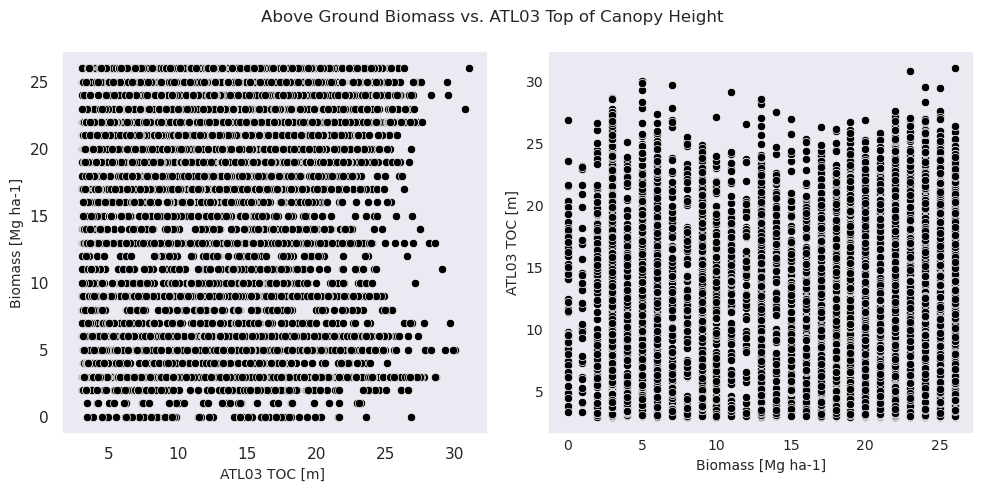

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='dark')

# Define the columns to use as x and y in the scatter plot
x_column = area1['biomass']
y_column = area1['TOC_Height']

# Create the subplots
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

# Create the first subplot with inverted X and Y axes
sns.scatterplot(data=area1, y=x_column, x=y_column, ax=axs[0], color='black')
axs[0].set_ylabel('Biomass [Mg ha-1]', fontsize=10)
axs[0].set_xlabel('ATL03 TOC [m] ', fontsize=10)

# Create the second subplot with inverted X and Y axes
sns.scatterplot(data=area1, y=y_column, x=x_column, ax=axs[1], color='black')
axs[1].set_ylabel('ATL03 TOC [m]', fontsize=10)
axs[1].set_xlabel('Biomass [Mg ha-1]', fontsize=10)

# Set the title above the subplots
fig.suptitle('Above Ground Biomass vs. ATL03 Top of Canopy Height', fontsize=12)

# Set the font size of various elements in the plot
plt.tick_params(axis='both', which='both', length=0, labelsize=10)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

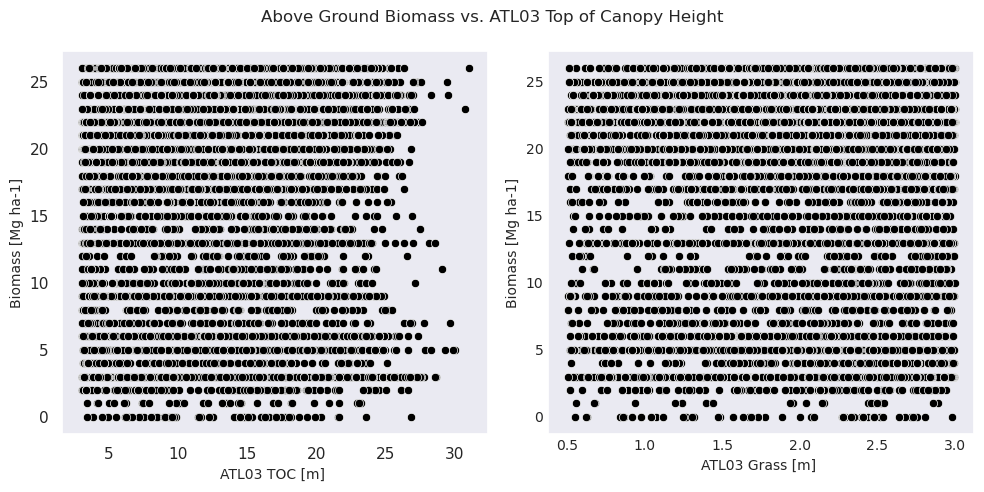

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='dark')

# Define the columns to use as x and y in the scatter plot
x_column = area1['biomass']
y_column = area1['TOC_Height']
z_column = area1['Grass_Height']

# Create the subplots
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

# Create the first subplot with inverted X and Y axes
sns.scatterplot(data=area1, y=x_column, x=y_column, ax=axs[0], color='black')
axs[0].set_ylabel('Biomass [Mg ha-1]', fontsize=10)
axs[0].set_xlabel('ATL03 TOC [m] ', fontsize=10)

# Create the second subplot with inverted X and Y axes
sns.scatterplot(data=area1, y=x_column, x=z_column, ax=axs[1], color='black')
axs[1].set_ylabel('Biomass [Mg ha-1]', fontsize=10)
axs[1].set_xlabel('ATL03 Grass [m] ', fontsize=10)

# Set the title above the subplots
fig.suptitle('Above Ground Biomass vs. ATL03 Top of Canopy Height', fontsize=12)

# Set the font size of various elements in the plot
plt.tick_params(axis='both', which='both', length=0, labelsize=10)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

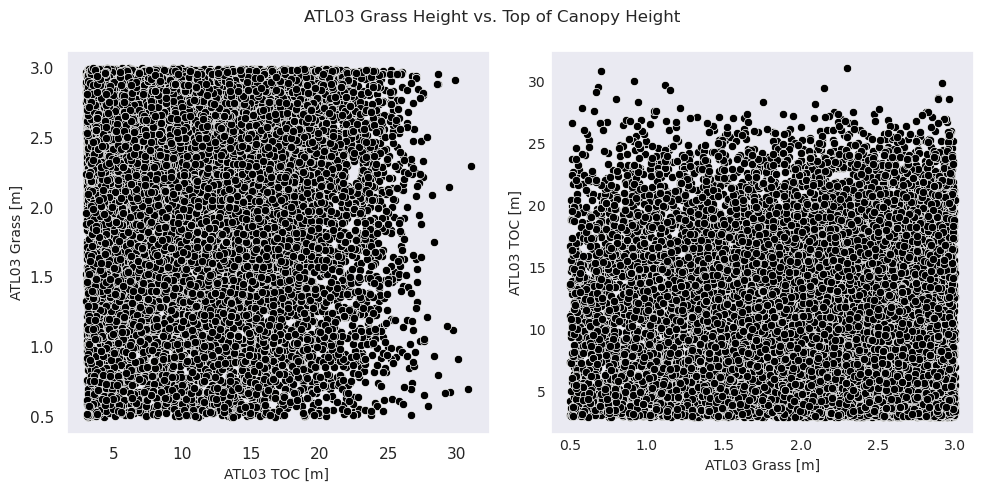

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='dark')

# Define the columns to use as x and y in the scatter plot
x_column = area1['Grass_Height']
y_column = area1['TOC_Height']

# Create the subplots
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

# Create the first subplot with inverted X and Y axes
sns.scatterplot(data=area1, y=x_column, x=y_column, ax=axs[0], color='black')
axs[0].set_ylabel('ATL03 Grass [m]', fontsize=10)
axs[0].set_xlabel('ATL03 TOC [m] ', fontsize=10)

# Create the second subplot with inverted X and Y axes
sns.scatterplot(data=area1, y=y_column, x=x_column, ax=axs[1], color='black')
axs[1].set_ylabel('ATL03 TOC [m]', fontsize=10)
axs[1].set_xlabel('ATL03 Grass [m]', fontsize=10)

# Set the title above the subplots
fig.suptitle('ATL03 Grass Height vs. Top of Canopy Height', fontsize=12)

# Set the font size of various elements in the plot
plt.tick_params(axis='both', which='both', length=0, labelsize=10)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

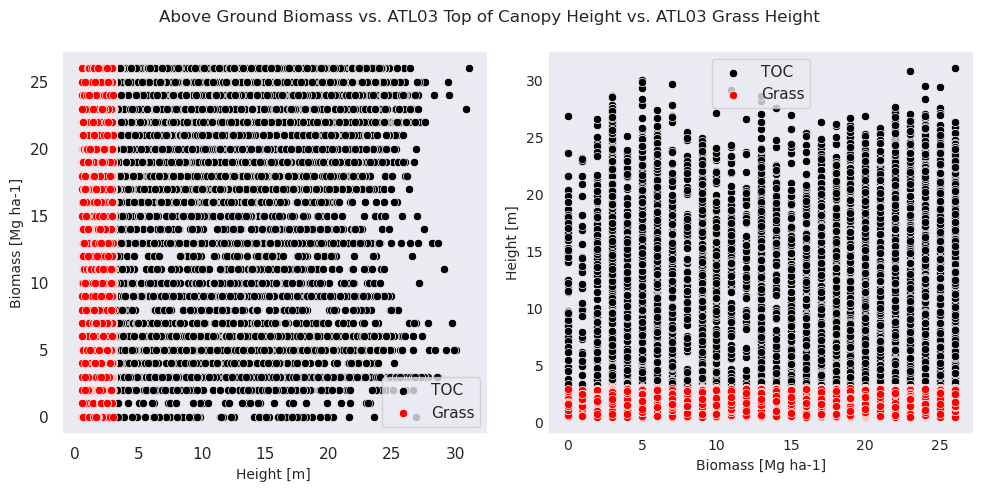

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='dark')

# Define the columns to use as x and y in the scatter plot
x_column = area1['biomass']
y_column = area1['TOC_Height']
y2_column = area1['Grass_Height']

# Create the subplots
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

# Create the first subplot with inverted X and Y axes
sns.scatterplot(data=area1, y=x_column, x=y_column, ax=axs[0], color='black', label='TOC')
sns.scatterplot(data=area1, y=x_column, x=y2_column, ax=axs[0], color='red', label='Grass')
axs[0].set_ylabel('Biomass [Mg ha-1]', fontsize=10)
axs[0].set_xlabel('Height [m] ', fontsize=10)

# Create the second subplot with inverted X and Y axes
sns.scatterplot(data=area1, y=y_column, x=x_column, ax=axs[1], color='black', label='TOC')
sns.scatterplot(data=area1, y=y2_column, x=x_column, ax=axs[1], color='red', label='Grass')
axs[1].set_ylabel('Height [m]', fontsize=10)
axs[1].set_xlabel('Biomass [Mg ha-1]', fontsize=10)

# Set the title above the subplots
fig.suptitle('Above Ground Biomass vs. ATL03 Top of Canopy Height vs. ATL03 Grass Height ', fontsize=12)

# Set the font size of various elements in the plot
plt.tick_params(axis='both', which='both', length=0, labelsize=10)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

#### Area2

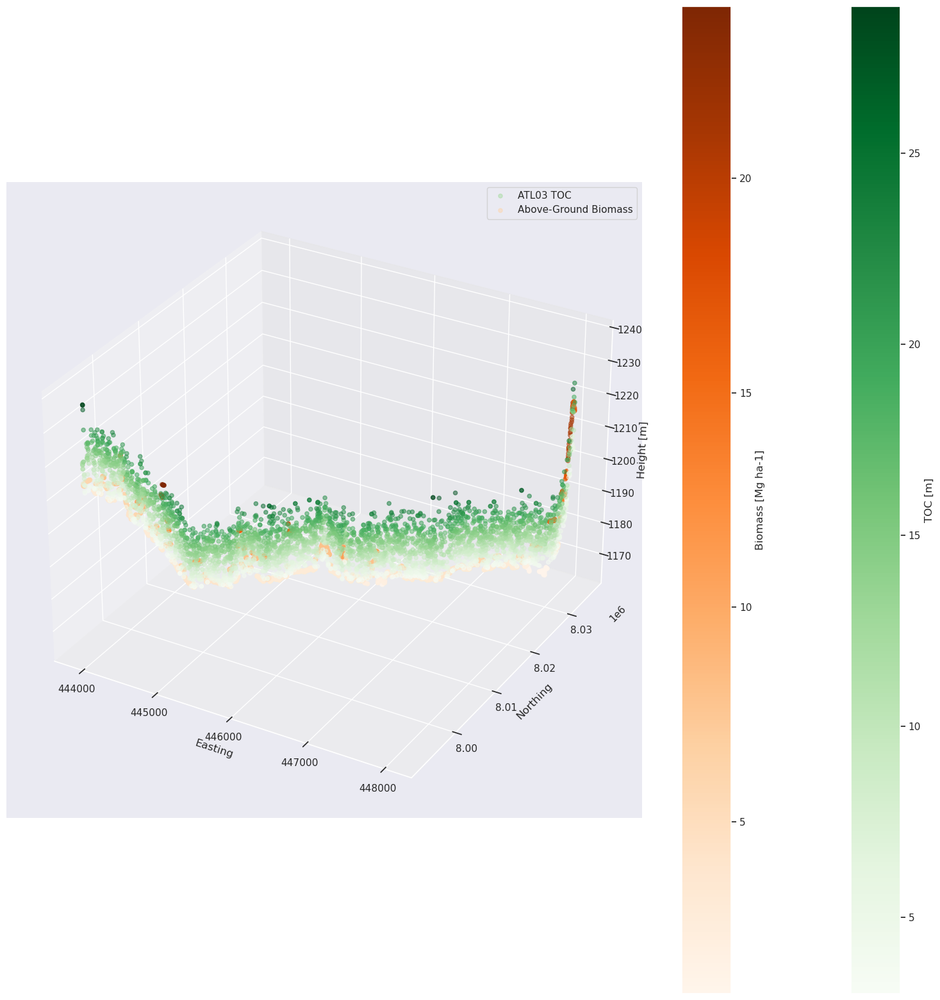

In [37]:
import matplotlib.cm as cm

# Create a 3D figure and axis
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Extract the X, Y, and Z coordinates from the geometry column
x = area2.geometry.x
y = area2.geometry.y
z = (area2.TOC_Height + area2.Ground_interp_Height)
v = (area2.biomass + area2.Ground_interp_Height)

# Set the marker size based on a column of the GeoDataFrame
size_column = 'TOC_Height'
size = area2[size_column] 
scaled_size = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Greens, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar2 = plt.colorbar(sm)
cbar2.set_label('TOC [m]')

# Set the marker size based on a column of the GeoDataFrame
size_column = 'biomass'
size = area2[size_column] 
scaled_size3 = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Oranges, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar = plt.colorbar(sm)
cbar.set_label('Biomass [Mg ha-1]')


# Plot the points in 3D with marker size based on the specified column
ax.scatter(x, y, z, c=area2['TOC_Height'], alpha=0.5, label='ATL03 TOC', cmap='Greens')#, s=scaled_size)
ax.scatter(x, y, v, c=area2['biomass'], alpha=0.5, label='Above-Ground Biomass', cmap='Oranges')#, s=scaled_size3)

# Set axis labels
ax.set_xlabel('Easting')
ax.set_ylabel('Northing')
ax.set_zlabel('Height [m]')
ax.legend()

# Show the plot
plt.show()

- create zoomed plot

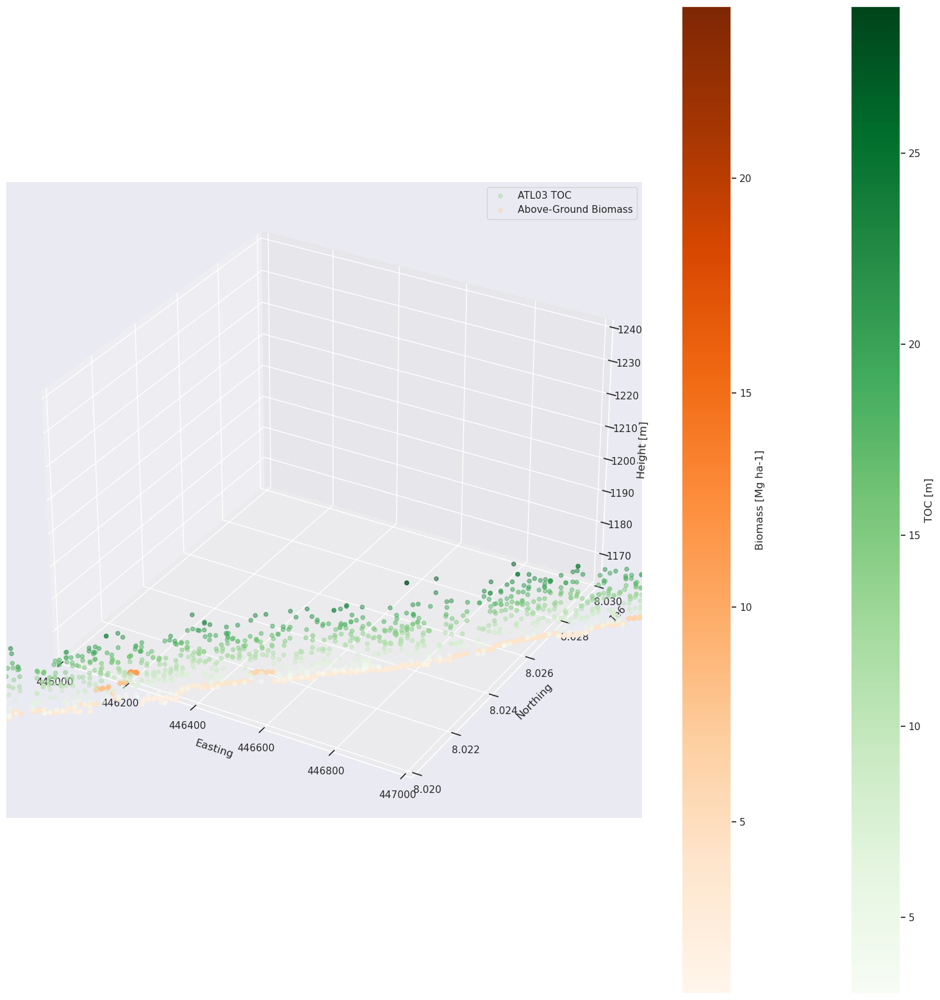

In [38]:
# Create a 3D figure and axis
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Extract the X, Y, and Z coordinates from the geometry column
x = area2.geometry.x
y = area2.geometry.y
z = (area2.TOC_Height + area2.Ground_interp_Height)
v = (area2.biomass + area2.Ground_interp_Height)

# Set the marker size based on a column of the GeoDataFrame
size_column = 'TOC_Height'
size = area2[size_column] 
scaled_size = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Greens, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar2 = plt.colorbar(sm)
cbar2.set_label('TOC [m]')

# Set the marker size based on a column of the GeoDataFrame
size_column = 'biomass'
size = area2[size_column] 
scaled_size3 = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Oranges, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar = plt.colorbar(sm)
cbar.set_label('Biomass [Mg ha-1]')


# Plot the points in 3D with marker size based on the specified column
ax.scatter(x, y, z, c=area2['TOC_Height'], alpha=0.5, label='ATL03 TOC', cmap='Greens')#, s=scaled_size)
ax.scatter(x, y, v, c=area2['biomass'], alpha=0.5, label='Above-Ground Biomass', cmap='Oranges')#, s=scaled_size3)

# Set axis labels
ax.set_xlabel('Easting')
ax.set_ylabel('Northing')
ax.set_zlabel('Height [m]')
ax.set_xlim(446000, 447000)
ax.set_ylim(8020000,8030000)

ax.legend()

# Show the plot
plt.show()

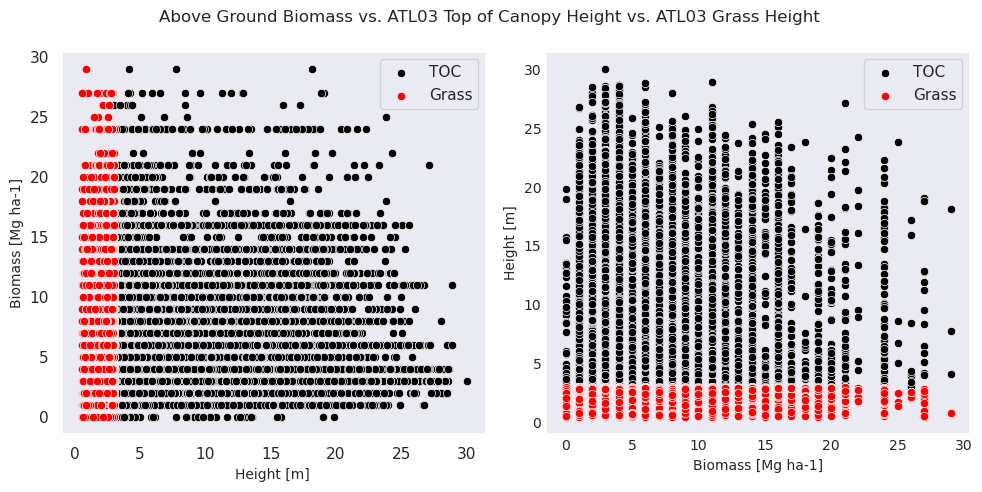

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='dark')

# Define the columns to use as x and y in the scatter plot
x_column = area2['biomass']
y_column = area2['TOC_Height']
y2_column = area2['Grass_Height']

# Create the subplots
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

# Create the first subplot with inverted X and Y axes
sns.scatterplot(data=area2, y=x_column, x=y_column, ax=axs[0], color='black', label='TOC')
sns.scatterplot(data=area2, y=x_column, x=y2_column, ax=axs[0], color='red', label='Grass')
axs[0].set_ylabel('Biomass [Mg ha-1]', fontsize=10)
axs[0].set_xlabel('Height [m] ', fontsize=10)

# Create the second subplot with inverted X and Y axes
sns.scatterplot(data=area2, y=y_column, x=x_column, ax=axs[1], color='black', label='TOC')
sns.scatterplot(data=area2, y=y2_column, x=x_column, ax=axs[1], color='red', label='Grass')
axs[1].set_ylabel('Height [m]', fontsize=10)
axs[1].set_xlabel('Biomass [Mg ha-1]', fontsize=10)

# Set the title above the subplots
fig.suptitle('Above Ground Biomass vs. ATL03 Top of Canopy Height vs. ATL03 Grass Height ', fontsize=12)

# Set the font size of various elements in the plot
plt.tick_params(axis='both', which='both', length=0, labelsize=10)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

#### Area3

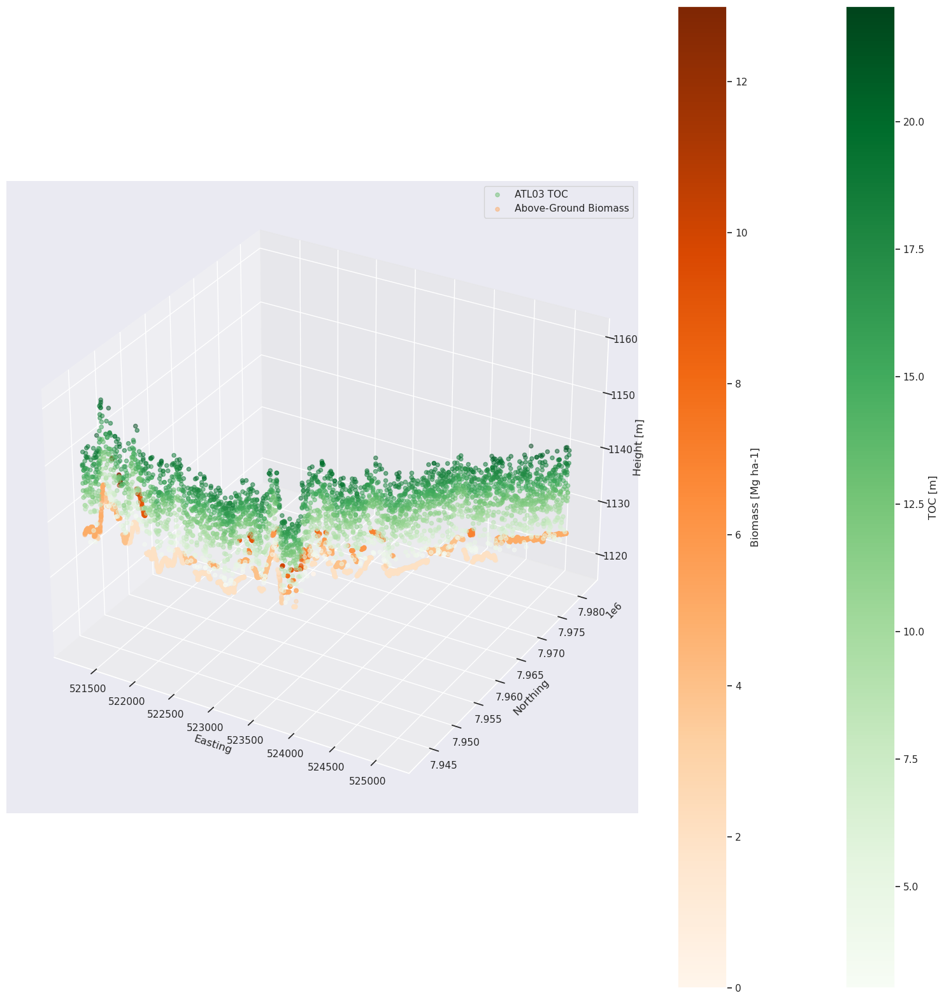

In [40]:
import matplotlib.cm as cm

# Create a 3D figure and axis
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Extract the X, Y, and Z coordinates from the geometry column
x = area3.geometry.x
y = area3.geometry.y
z = (area3.TOC_Height + area3.Ground_interp_Height)
v = (area3.biomass + area3.Ground_interp_Height)

# Set the marker size based on a column of the GeoDataFrame
size_column = 'TOC_Height'
size = area3[size_column] 
scaled_size = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Greens, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar2 = plt.colorbar(sm)
cbar2.set_label('TOC [m]')

# Set the marker size based on a column of the GeoDataFrame
size_column = 'biomass'
size = area3[size_column] 
scaled_size3 = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Oranges, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar = plt.colorbar(sm)
cbar.set_label('Biomass [Mg ha-1]')


# Plot the points in 3D with marker size based on the specified column
ax.scatter(x, y, z, c=area3['TOC_Height'], alpha=0.5, label='ATL03 TOC', cmap='Greens')#, s=scaled_size)
ax.scatter(x, y, v, c=area3['biomass'], alpha=0.5, label='Above-Ground Biomass', cmap='Oranges')#, s=scaled_size3)

# Set axis labels
ax.set_xlabel('Easting')
ax.set_ylabel('Northing')
ax.set_zlabel('Height [m]')
ax.legend()

# Show the plot
plt.show()

- create zoomed plot

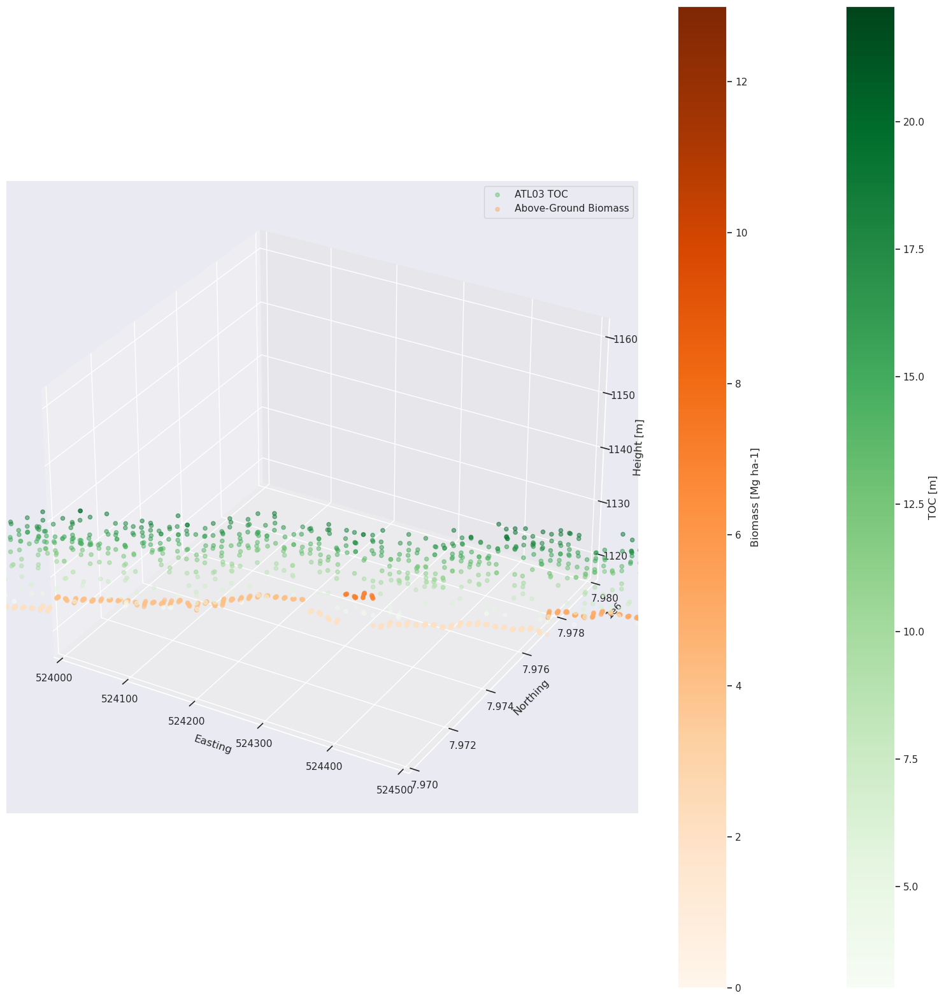

In [41]:
# Create a 3D figure and axis
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Extract the X, Y, and Z coordinates from the geometry column
x = area3.geometry.x
y = area3.geometry.y
z = (area3.TOC_Height + area3.Ground_interp_Height)
v = (area3.biomass + area3.Ground_interp_Height)

# Set the marker size based on a column of the GeoDataFrame
size_column = 'TOC_Height'
size = area3[size_column] 
scaled_size = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Greens, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar2 = plt.colorbar(sm)
cbar2.set_label('TOC [m]')

# Set the marker size based on a column of the GeoDataFrame
size_column = 'biomass'
size = area3[size_column] 
scaled_size3 = size / size.max() * 100 # Scale the size to be between 0 and 100

# Create a colorbar based on the size variable
sm = plt.cm.ScalarMappable(cmap=cm.Oranges, norm=plt.Normalize(vmin=size.min(), vmax=size.max()))
sm._A = []
cbar = plt.colorbar(sm)
cbar.set_label('Biomass [Mg ha-1]')


# Plot the points in 3D with marker size based on the specified column
ax.scatter(x, y, z, c=area3['TOC_Height'], alpha=0.5, label='ATL03 TOC', cmap='Greens')#, s=scaled_size)
ax.scatter(x, y, v, c=area3['biomass'], alpha=0.5, label='Above-Ground Biomass', cmap='Oranges')#, s=scaled_size3)

# Set axis labels
ax.set_xlabel('Easting')
ax.set_ylabel('Northing')
ax.set_zlabel('Height [m]')
ax.set_xlim(524000, 524500)
ax.set_ylim(7970000,7980000)

ax.legend()

# Show the plot
plt.show()

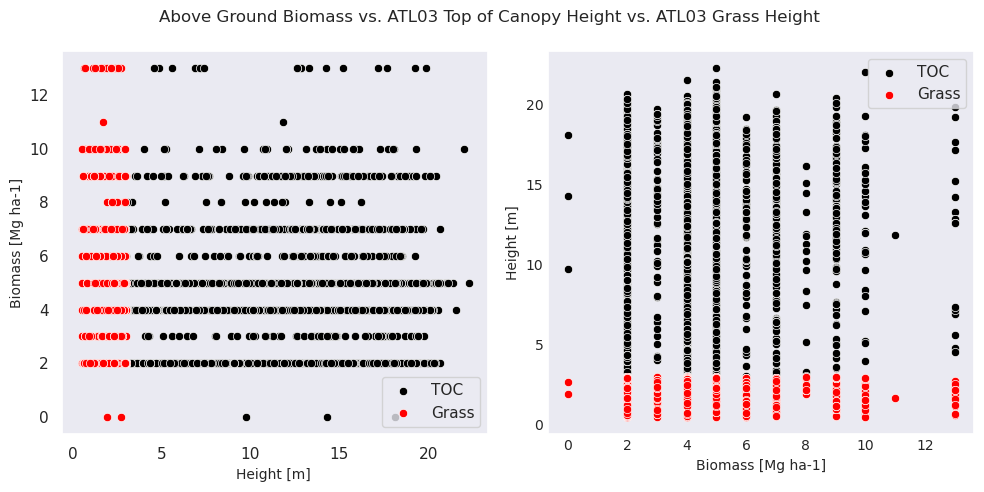

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='dark')

# Define the columns to use as x and y in the scatter plot
x_column = area3['biomass']
y_column = area3['TOC_Height']
y2_column = area3['Grass_Height']

# Create the subplots
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

# Create the first subplot with inverted X and Y axes
sns.scatterplot(data=area3, y=x_column, x=y_column, ax=axs[0], color='black', label='TOC')
sns.scatterplot(data=area3, y=x_column, x=y2_column, ax=axs[0], color='red', label='Grass')
axs[0].set_ylabel('Biomass [Mg ha-1]', fontsize=10)
axs[0].set_xlabel('Height [m] ', fontsize=10)

# Create the second subplot with inverted X and Y axes
sns.scatterplot(data=area3, y=y_column, x=x_column, ax=axs[1], color='black', label='TOC')
sns.scatterplot(data=area3, y=y2_column, x=x_column, ax=axs[1], color='red', label='Grass')
axs[1].set_ylabel('Height [m]', fontsize=10)
axs[1].set_xlabel('Biomass [Mg ha-1]', fontsize=10)

# Set the title above the subplots
fig.suptitle('Above Ground Biomass vs. ATL03 Top of Canopy Height vs. ATL03 Grass Height ', fontsize=12)

# Set the font size of various elements in the plot
plt.tick_params(axis='both', which='both', length=0, labelsize=10)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

- Descriptive statistics

In [23]:
area1 = area1_TOC_biomass_gch 
area2 = area2_TOC_biomass_gch 
area3 = area3_TOC_biomass_gch 

In [31]:
area1.head()

,geometry,index_right,Latitude,Longitude,Along-track_Distance,Land,Easting,Northing,crosstrack,alongtrack,...,NN,Photons_Numb,Date,easting_sq,northing_sq,clipped,distance,biomass,gch_m,Grass_Height
0,POINT (536476.540 7823154.092),5997176,-19.686674,15.347974,9.430696,0.0,536471.540333,7.823153e+06,2466.323778,2.187517e+06,...,44.0,7.0,2020-12-10,536,7823,True,5.036923,3,2,2.218735
1,POINT (536476.540 7823154.092),5997176,-19.686674,15.347974,9.430696,0.0,536471.540333,7.823153e+06,2466.323778,2.187517e+06,...,44.0,7.0,2020-12-10,536,7823,True,5.036923,3,2,2.218735
2,POINT (536476.540 7823174.092),5997039,-19.686482,15.347993,8.205918,0.0,536473.543657,7.823175e+06,2466.475254,2.187495e+06,...,11.0,3.0,2020-12-10,536,7823,True,3.043647,3,1,2.218735
3,POINT (536476.540 7823184.092),5996987,-19.686400,15.348001,19.021019,0.0,536474.430945,7.823184e+06,2466.521395,2.187486e+06,...,7.0,4.0,2020-12-10,536,7823,True,2.132072,3,1,2.218735
4,POINT (536476.540 7823194.092),5996884,-19.686272,15.348016,4.821840,0.0,536476.010693,7.823198e+06,2466.380640,2.187472e+06,...,38.0,3.0,2020-12-10,536,7823,True,3.832702,3,1,1.984319


In [32]:
# Load the shapefiles with S1 VVdVh data 
s1_area1 = gpd.read_file('../raster_analysis/kdtree_areas/shapefiles/VVdVH_med_Oct_2018_Mar_2022_s1_area1.shp')
s1_area2 = gpd.read_file('../raster_analysis/kdtree_areas/shapefiles/VVdVH_med_Oct_2018_Mar_2022_s1_area2.shp')
s1_area3 = gpd.read_file('../raster_analysis/kdtree_areas/shapefiles/VVdVH_med_Oct_2018_Mar_2022_s1_area3.shp')

In [33]:
# Use KDTree to retrieve closest grass height values
area1 = kdtree_comparison(area1, s1_area1, 's1_median', 'S1_VVdVH_median')
area2 = kdtree_comparison(area2, s1_area2, 's1_median', 'S1_VVdVH_median')
area3 = kdtree_comparison(area3, s1_area3, 's1_median', 'S1_VVdVH_median')

In [40]:
# Calculate the descriptive statistics for each column in each area
stats1 = area1[['Grass_Height', 'TOC_Height', 'biomass', 'S1_VVdVH_median']].describe().round(2)
stats2 = area2[['Grass_Height', 'TOC_Height', 'biomass', 'S1_VVdVH_median']].describe().round(2)
stats3 = area3[['Grass_Height', 'TOC_Height', 'biomass', 'S1_VVdVH_median']].describe().round(2)

# Concatenate the statistics for each area into a single table
all_stats = pd.concat([stats1, stats2, stats3], axis=1, keys=['Area 1', 'Area 2', 'Area 3'])

print(all_stats)

            Area 1                                            Area 2  \
      Grass_Height TOC_Height   biomass S1_VVdVH_median Grass_Height   
count     14568.00   14568.00  14568.00        14568.00     19631.00   
mean          2.06      11.67     16.48            0.67         1.92   
std           0.69       6.20      8.41            0.00         0.74   
min           0.50       3.00      0.00            0.67         0.50   
25%           1.55       5.72      7.00            0.67         1.32   
50%           2.21      11.54     20.00            0.67         2.03   
75%           2.65      16.34     24.00            0.67         2.56   
max           3.00      31.06     26.00            0.67         3.00   

                                                 Area 3                       \
      TOC_Height   biomass S1_VVdVH_median Grass_Height TOC_Height   biomass   
count   19631.00  19631.00        19631.00     13124.00   13124.00  13124.00   
mean       10.47      5.31            0

In [41]:
# Print the table of descriptive statistics in latex format
latex_table = all_stats.to_latex()
print(latex_table)

\begin{tabular}{lrrrrrrrrrrrr}
\toprule
{} & \multicolumn{4}{l}{Area 1} & \multicolumn{4}{l}{Area 2} & \multicolumn{4}{l}{Area 3} \\
{} & Grass\_Height & TOC\_Height &   biomass & S1\_VVdVH\_median & Grass\_Height & TOC\_Height &   biomass & S1\_VVdVH\_median & Grass\_Height & TOC\_Height &   biomass & S1\_VVdVH\_median \\
\midrule
count &     14568.00 &   14568.00 &  14568.00 &        14568.00 &     19631.00 &   19631.00 &  19631.00 &        19631.00 &     13124.00 &   13124.00 &  13124.00 &        13124.00 \\
mean  &         2.06 &      11.67 &     16.48 &            0.67 &         1.92 &      10.47 &      5.31 &            0.68 &         1.70 &      11.55 &      3.85 &            0.71 \\
std   &         0.69 &       6.20 &      8.41 &            0.00 &         0.74 &       5.91 &      3.81 &            0.00 &         0.72 &       5.41 &      2.17 &            0.00 \\
min   &         0.50 &       3.00 &      0.00 &            0.67 &         0.50 &       3.00 &      0.00 &            

- RSME

In [44]:
import pandas as pd
import numpy as np
from tabulate import tabulate

# Define the function to calculate RMSE
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

# Create a list of the three areas
areas = [area1, area2, area3]

# Create an empty list to store the RMSE results for each area
results = []

# Loop through the areas and calculate the RMSE for each comparison
for area in areas:
    rmse_Grass_gch = rmse(area['Grass_Height'], area['gch_m'])
    rmse_Grass_biomass = rmse(area['Grass_Height'], area['biomass'])
    rmse_Grass_s1 = rmse(area['Grass_Height'], area['S1_VVdVH_median'])

    # Append the RMSE results to the list
    results.append([rmse_Grass_gch, rmse_Grass_biomass, rmse_Grass_s1])

# Create a table with the RMSE results for all areas
table = [
    ["Area 1"] + results[0],
    ["Area 2"] + results[1],
    ["Area 3"] + results[2]
]

# Format the table as LaTeX and print it
latex_table = tabulate(table, tablefmt='latex_booktabs', headers=['Area', 'Grass Height vs GCH', 'Grass Height vs biomass', 'Grass Height vs S1 VV/VH'], floatfmt=".4f")
print(latex_table)


\begin{tabular}{lrrr}
\toprule
 Area   &   Grass Height vs GCH &   Grass Height vs biomass &   Grass Height vs S1 VV/VH \\
\midrule
 Area 1 &                1.4646 &                   16.6703 &                     1.5520 \\
 Area 2 &                1.2478 &                    5.1140 &                     1.4451 \\
 Area 3 &                0.9779 &                    3.1194 &                     1.2184 \\
\bottomrule
\end{tabular}


In [45]:
import pandas as pd
import numpy as np
from tabulate import tabulate

# Define the function to calculate RMSE
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

# Create a list of the three areas
areas = [area1, area2, area3]

# Create an empty list to store the RMSE results for each area
results = []

# Loop through the areas and calculate the RMSE for each comparison
for area in areas:
    rmse_TOC_gch = rmse(area['TOC_Height'], area['gch_m'])
    rmse_TOC_biomass = rmse(area['TOC_Height'], area['biomass'])
    rmse_TOC_s1 = rmse(area['TOC_Height'], area['S1_VVdVH_median'])

    # Append the RMSE results to the list
    results.append([rmse_TOC_gch, rmse_TOC_biomass, rmse_TOC_s1])

# Create a table with the RMSE results for all areas
table = [
    ["Area 1"] + results[0],
    ["Area 2"] + results[1],
    ["Area 3"] + results[2],
]

# Format the table as LaTeX and print it
latex_table = tabulate(table, tablefmt='latex_booktabs', headers=['Area', 'TOC Height vs GCH', 'TOC Height vs AGB', 'TOC Height vs S1 VV/VH'], floatfmt=".4f")
print(latex_table)

\begin{tabular}{lrrr}
\toprule
 Area   &   TOC Height vs GCH &   TOC Height vs AGB &   TOC Height vs S1 VV/VH \\
\midrule
 Area 1 &             12.1009 &             12.2790 &                  12.6236 \\
 Area 2 &             11.0951 &              8.7657 &                  11.4373 \\
 Area 3 &             11.4093 &              9.7584 &                  12.1168 \\
\bottomrule
\end{tabular}


---